In [1]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.6 MB/s eta 0:00:00:00:0100:01


In [2]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import supervision
import transformers
import pytorch_lightning

print(
    "; supervision:", supervision.__version__, 
    "; transformers:", transformers.__version__, 
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
; supervision: 0.3.0 ; transformers: 4.51.3 ; pytorch_lightning: 2.5.1.post0


In [3]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor
import cv2
import warnings
import supervision as sv
warnings.filterwarnings('ignore')

2025-05-18 11:12:08.535607: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747566728.723633      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747566728.777588      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT, size=800)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [5]:
import os
import torchvision


# settings
ANNOTATION_FILE_NAME = "annotations.json"
TRAIN_DIRECTORY = os.path.join("/kaggle/input/mdp-dac-204/output", "train")
VAL_DIRECTORY = os.path.join("/kaggle/input/mdp-dac-204/output", "val")
TEST_DIRECTORY = os.path.join("/kaggle/input/mdp-dac-204/output", "test")


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self, 
        image_directory_path: str, 
        image_processor, 
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)        
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY, 
    image_processor=image_processor, 
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY, 
    image_processor=image_processor, 
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY, 
    image_processor=image_processor, 
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.32s)
creating index...
index created!
loading annotations into memory...
Done (t=0.54s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Number of training examples: 12000
Number of validation examples: 1500
Number of test examples: 1500


In [6]:
MODEL_PATH = os.path.join('/kaggle/input/training-contd-2', 'custom-model-v3')
MODEL_PATH2 = os.path.join('/kaggle/working/', 'custom-model')

In [7]:
model.model.save_pretrained(MODEL_PATH2)

In [8]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
model.to(DEVICE)

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

Image #4829
ground truth


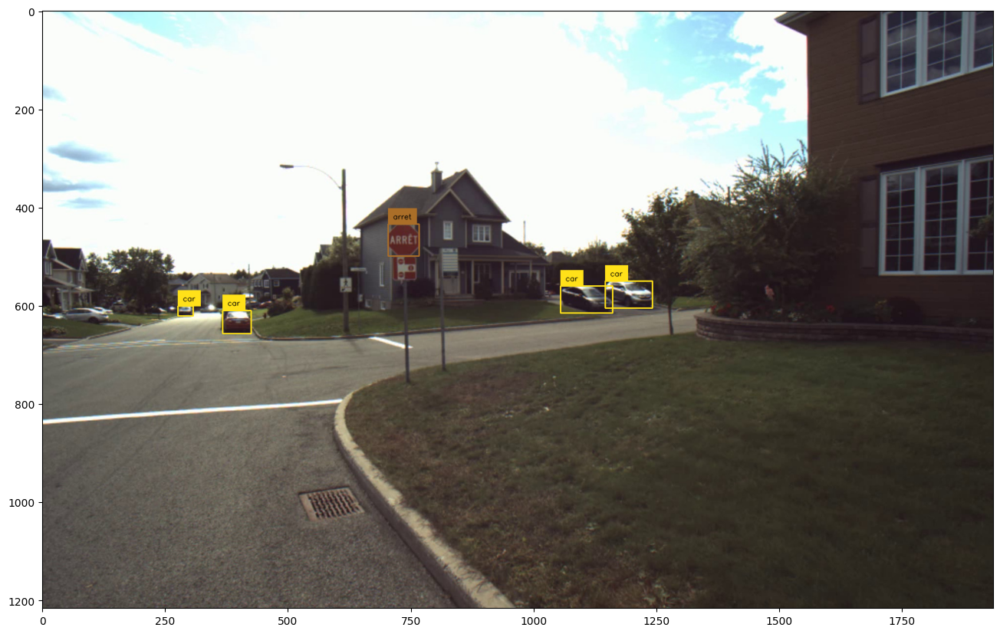

detections


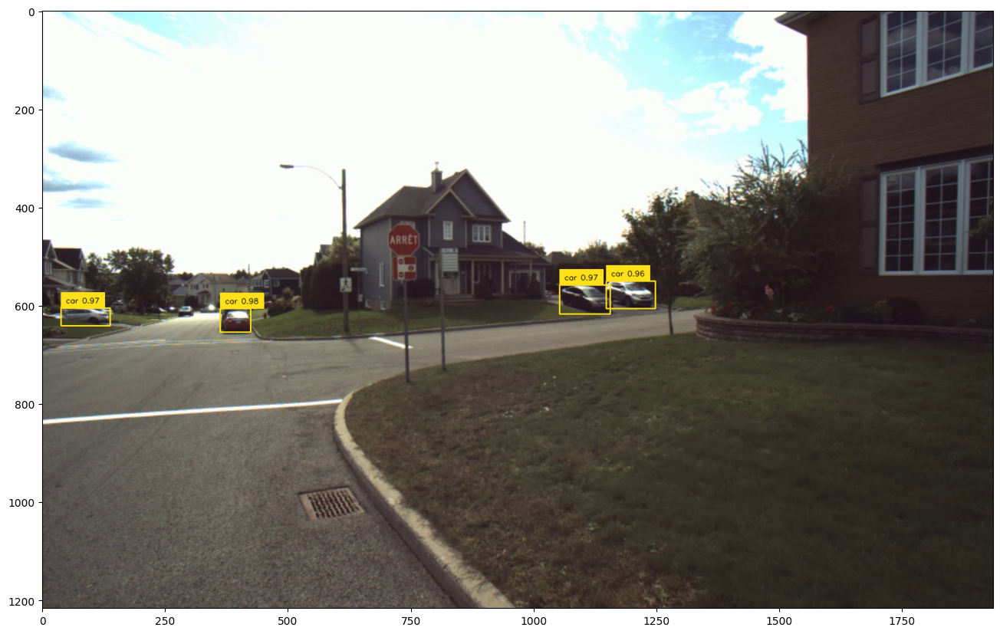

In [9]:
import random
import cv2
import numpy as np


# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons 
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('ground truth')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad():

    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs, 
        threshold=0.75, 
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.75)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

In [10]:
!pip install -q coco_eval
def compare_with_baseline_jupyter(image, image_processor, model, id2label, box_annotator, img_id, save_path):
    """
    Compare model prediction with baseline and save annotated result.
    This is a placeholder; customize as needed.
    """
    os.makedirs(save_path, exist_ok=True)

    # Inference
    with torch.no_grad():
        inputs = image_processor(images=image, return_tensors="pt").to(model.device)
        outputs = model(**inputs)

        target_sizes = torch.tensor([image.shape[:2]]).to(model.device)
        results = image_processor.post_process_object_detection(
            outputs=outputs,
            threshold=0.5,
            target_sizes=target_sizes
        )[0]

    # Convert detections
    dets = sv.Detections.from_transformers(transformers_results=results)

    # Prepare labels
    labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in dets]

    # Annotate
    annotated_image = box_annotator.annotate(scene=image.copy(), detections=dets, labels=labels)

    # Save image
    out_path = os.path.join(save_path, f"{img_id}.jpg")
    cv2.imwrite(out_path, annotated_image)


  Preparing metadata (setup.py) ... done


In [11]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

                 class  precision    recall        f1  support      TP     FP  \
0                biker   0.229834  0.218182  0.223927    220.0   114.0   67.0   
1                  car   0.844562  0.696413  0.763366   2286.0  1592.0  293.0   
2           pedestrian   0.786624  0.451554  0.573751    547.0   247.0   67.0   
3         trafficLight   0.793522  0.488778  0.604938    401.0   196.0   51.0   
4    traficLight-Green   0.240000  0.500000  0.324324    204.0   102.0  323.0   
5       traficLight-GL   0.631579  0.157895  0.252631     76.0    12.0    7.0   
6      traficLight-Red   0.600000  0.063444  0.114754    331.0    21.0   14.0   
7       traficLight-RL   0.000000  0.000000  0.000000     52.0     0.0    0.0   
8   traficLight-Yellow   0.200000  0.009901  0.018868    101.0     1.0    4.0   
9       traficLight-YL   0.500000  0.013699  0.026667     73.0     1.0    1.0   
10               truck   0.705882  0.313725  0.434389    153.0    48.0   20.0   
11               arret   0.2

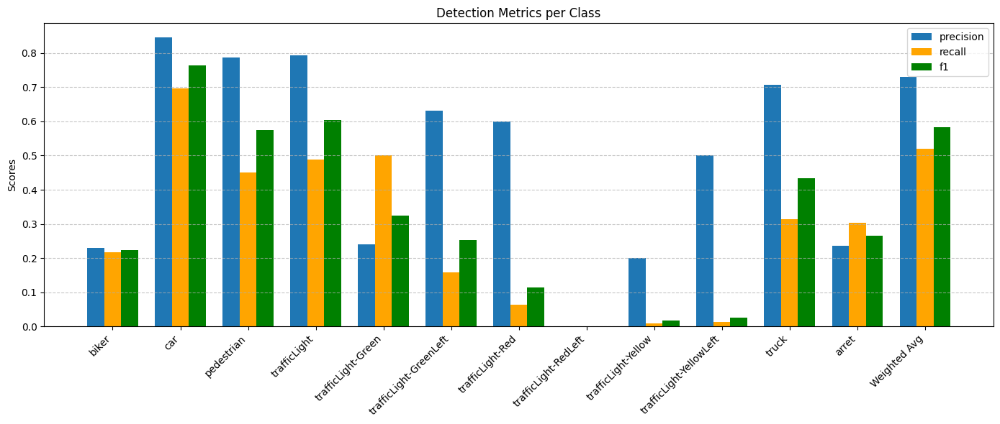

In [26]:
import os
import cv2
import numpy as np
import torch
import supervision as sv
import matplotlib.pyplot as plt
import pandas as pd
from torchvision.ops import nms
from collections import defaultdict

# Setup
categories = TEST_DATASET.coco.cats
id2label = {k: v["name"] for k, v in categories.items()}
box_annotator = sv.BoxAnnotator(text_scale=1.5)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Parameters
GRID_COLS = 5
NUM_IMAGES = 1500
RESIZE_SHAPE = (800, 800)

# Collect frames
image_ids = TEST_DATASET.coco.getImgIds()
selected_ids = image_ids[0:NUM_IMAGES:2]
all_frames = []

# Metrics containers
true_positives = defaultdict(int)
false_positives = defaultdict(int)
false_negatives = defaultdict(int)
predictions_coco_format = []

iou_threshold = 0
image_id_counter = 0

def compute_iou(box1, box2):
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    box1Area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2Area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)
    return interArea / float(box1Area + box2Area - interArea + 1e-6)

def match_predictions_to_gt(preds, gts, iou_thresh=0.5):
    matched_gt = set()
    for pred_box, pred_cls in zip(preds.xyxy, preds.class_id):
        matched = False
        for i, (gt_box, gt_cls) in enumerate(zip(gts.xyxy, gts.class_id)):
            if i in matched_gt or pred_cls != gt_cls:
                continue
            if compute_iou(pred_box, gt_box) >= iou_thresh:
                matched_gt.add(i)
                matched = True
                break
        if matched:
            true_positives[pred_cls] += 1
        else:
            false_positives[pred_cls] += 1
    for i, gt_cls in enumerate(gts.class_id):
        if i not in matched_gt:
            false_negatives[gt_cls] += 1

# --- Main Loop ---
for image_id in selected_ids:
    try:
        image_info = TEST_DATASET.coco.loadImgs(image_id)[0]
        annotations = TEST_DATASET.coco.imgToAnns[image_id]
        image_path = os.path.join(TEST_DATASET.root, image_info['file_name'])
        image = cv2.imread(image_path)

        # Ground Truth
        gt_detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
        frame = box_annotator.annotate(scene=image.copy(), detections=gt_detections, labels=[
            f"{id2label[class_id]}" for _, _, class_id, _ in gt_detections
        ])

        # Inference
        with torch.no_grad():
            inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
            outputs = model(**inputs)
            target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
            results = image_processor.post_process_object_detection(
                outputs=outputs, threshold=0.50, target_sizes=target_sizes
            )[0]

        dets = sv.Detections.from_transformers(transformers_results=results)

        # NMS
        if len(dets) > 0:
            boxes = torch.tensor(dets.xyxy, device=DEVICE)
            scores = torch.tensor(dets.confidence, device=DEVICE)
            keep_idxs = nms(boxes, scores, iou_threshold=iou_threshold).cpu().numpy()
            dets = sv.Detections(
                xyxy=np.array([dets.xyxy[i] for i in keep_idxs]),
                confidence=np.array([dets.confidence[i] for i in keep_idxs]),
                class_id=np.array([dets.class_id[i] for i in keep_idxs])
            )

        # Match predictions to ground truths
        match_predictions_to_gt(dets, gt_detections, iou_thresh=iou_threshold)

        # Save detections in COCO format
        for i in range(len(dets)):
            x1, y1, x2, y2 = dets.xyxy[i]
            width = x2 - x1
            height = y2 - y1
            predictions_coco_format.append({
                "image_id": image_id,
                "category_id": int(dets.class_id[i]),
                "bbox": [float(x1), float(y1), float(width), float(height)],
                "score": float(dets.confidence[i])
            })

        # Annotate and resize frame
        labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in dets]
        frame = box_annotator.annotate(scene=image.copy(), detections=dets, labels=labels)
        frame = cv2.resize(frame, RESIZE_SHAPE)

        all_frames.append(frame)

    except Exception as e:
        None

# --- Padding to prevent grid errors ---
expected_shape = (RESIZE_SHAPE[1], RESIZE_SHAPE[0], 3)
all_frames = [f for f in all_frames if f.shape == expected_shape]

remainder = len(all_frames) % GRID_COLS
if remainder != 0:
    pad_count = GRID_COLS - remainder
    blank_frame = np.zeros(expected_shape, dtype=np.uint8)
    all_frames.extend([blank_frame] * pad_count)

# --- Show result grid ---
GRID_ROWS = (len(all_frames) + GRID_COLS - 1) // GRID_COLS
rows = [np.hstack(all_frames[i:i+GRID_COLS]) for i in range(0, len(all_frames), GRID_COLS)]
grid = np.vstack(rows)

# plt.figure(figsize=(32, 32))
# grid_rgb = cv2.cvtColor(grid, cv2.COLOR_BGR2RGB)
# plt.imshow(grid_rgb)
# plt.axis('off')
# plt.show()

# --- Compute and show metrics ---
def compute_metrics(tp, fp, fn):
    metrics = {}
    total_support = 0
    weighted_precision = 0
    weighted_recall = 0
    weighted_f1 = 0

    all_classes = set(tp.keys()).union(fp.keys()).union(fn.keys())

    for cls in all_classes:
        support = tp[cls] + fn[cls]
        precision = tp[cls] / (tp[cls] + fp[cls] + 1e-6)
        recall = tp[cls] / (tp[cls] + fn[cls] + 1e-6)
        f1 = 2 * precision * recall / (precision + recall + 1e-6)

        total_support += support
        weighted_precision += precision * support
        weighted_recall += recall * support
        weighted_f1 += f1 * support

        metrics[id2label[cls]] = {
            "precision": precision,
            "recall": recall,
            "f1": f1,
            "support": support,
            "TP": tp[cls],
            "FP": fp[cls],
            "FN": fn[cls]
        }

    if total_support > 0:
        metrics["Weighted Avg"] = {
            "precision": weighted_precision / total_support,
            "recall": weighted_recall / total_support,
            "f1": weighted_f1 / total_support,
            "support": total_support,
            "TP": sum(tp.values()),
            "FP": sum(fp.values()),
            "FN": sum(fn.values())
        }

    return metrics

metrics = compute_metrics(true_positives, false_positives, false_negatives)
df = pd.DataFrame(metrics).T
print(df)
df[["precision", "recall", "f1"]].plot.bar(figsize=(14, 6), title="Detection Metrics per Class")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


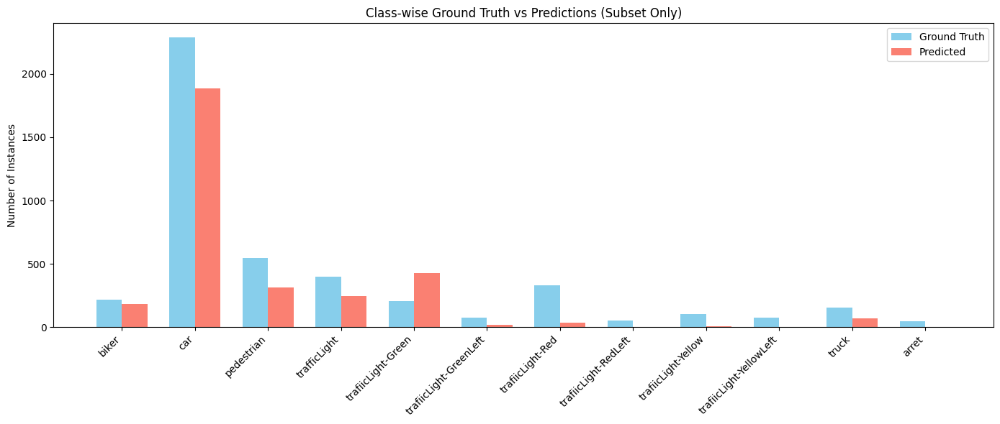

In [13]:
from collections import Counter

# Initialize counters
gt_counts_subset = Counter()
pred_counts_subset = Counter()

# Loop over only tested image IDs
for image_id in selected_ids:
    # Ground Truth annotations for this image
    annotations = TEST_DATASET.coco.imgToAnns[image_id]
    for ann in annotations:
        gt_counts_subset[ann['category_id']] += 1

    # Predictions for this image (already saved in predictions_coco_format)
    for pred in predictions_coco_format:
        if pred['image_id'] == image_id:
            pred_counts_subset[pred['category_id']] += 1

# Convert to label-name mappings
all_class_ids = sorted(set(gt_counts_subset.keys()).union(pred_counts_subset.keys()))
class_labels = [id2label[cid] for cid in all_class_ids]
gt_vals = [gt_counts_subset.get(cid, 0) for cid in all_class_ids]
pred_vals = [pred_counts_subset.get(cid, 0) for cid in all_class_ids]

# Plot
x = np.arange(len(class_labels))
width = 0.35

plt.figure(figsize=(14, 6))
plt.bar(x - width/2, gt_vals, width, label='Ground Truth', color='skyblue')
plt.bar(x + width/2, pred_vals, width, label='Predicted', color='salmon')
plt.xticks(ticks=x, labels=class_labels, rotation=45, ha='right')
plt.ylabel("Number of Instances")
plt.title("Class-wise Ground Truth vs Predictions (Subset Only)")
plt.legend()
plt.tight_layout()
plt.show()


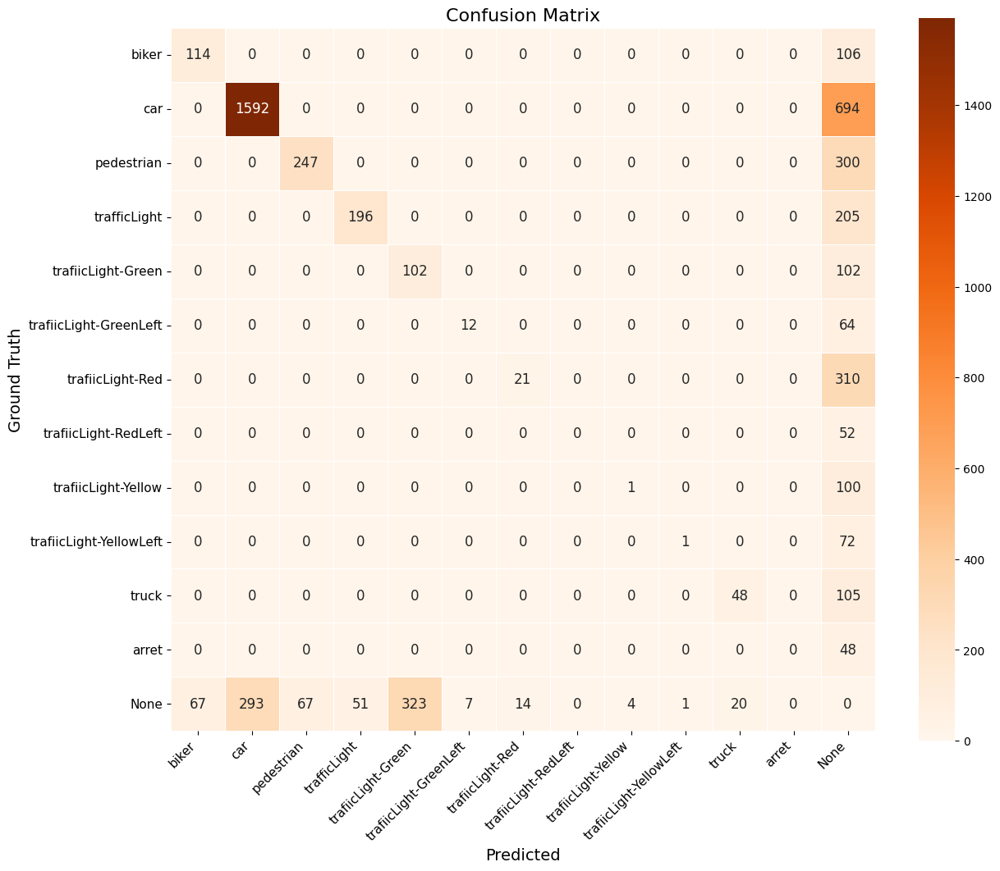

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Build y_true and y_pred
y_true = []
y_pred = []

for cls in all_class_ids:
    y_true += [cls] * (true_positives[cls] + false_negatives[cls])
    y_pred += [cls] * true_positives[cls]
    y_pred += [-1] * false_negatives[cls]

    y_true += [-1] * false_positives[cls]
    y_pred += [cls] * false_positives[cls]

# Label mapping
labels = [id2label[cid] for cid in all_class_ids]
cm_labels = labels + ["None"]
y_true_named = [id2label.get(i, "None") for i in y_true]
y_pred_named = [id2label.get(i, "None") for i in y_pred]

# Confusion matrix
cm = confusion_matrix(y_true_named, y_pred_named, labels=cm_labels)

# Plotting
fig, ax = plt.subplots(figsize=(len(cm_labels), len(cm_labels)))
sns.heatmap(cm, annot=True, fmt='d', cmap="Oranges",
            xticklabels=cm_labels, yticklabels=cm_labels,
            cbar=True, square=True, linewidths=0.5,
            cbar_kws={'shrink': 0.73}, annot_kws={"size": 12}, ax=ax)

ax.set_title("Confusion Matrix", fontsize=16)
ax.set_xlabel("Predicted", fontsize=14)
ax.set_ylabel("Ground Truth", fontsize=14)
ax.set_xticklabels(cm_labels, rotation=45, ha='right' , fontsize = 11)
ax.set_yticklabels(cm_labels, rotation=0 ,fontsize = 11)
ax.set_aspect("equal")

plt.tight_layout()
plt.show()


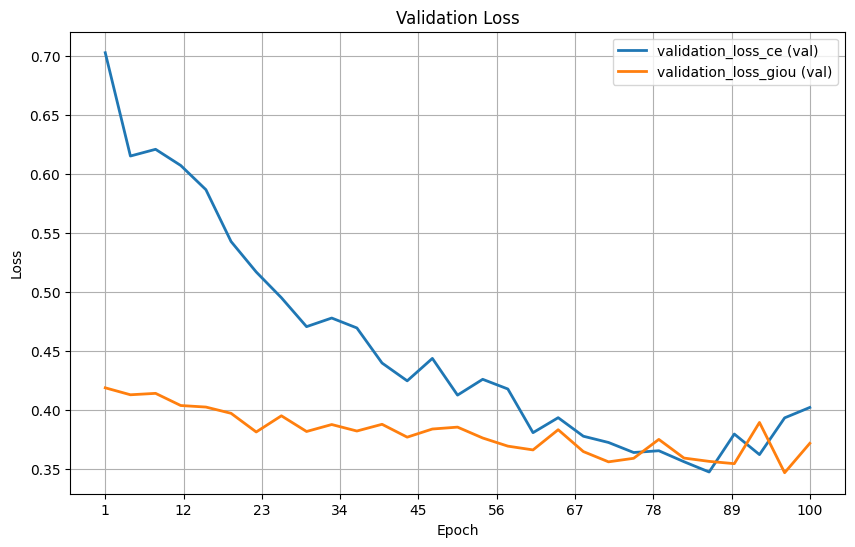

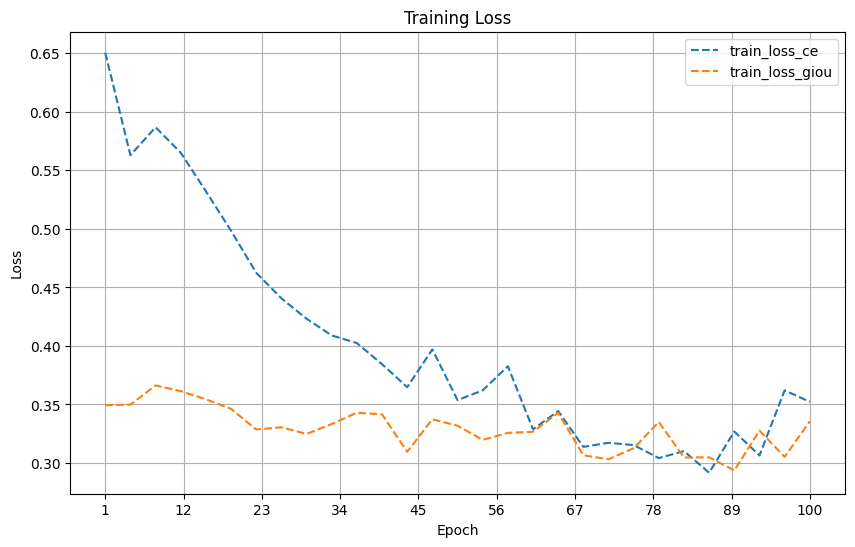

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV
df = pd.read_csv('/kaggle/input/loss-values/loss.csv')

# Display column names for reference
print("Available columns:", df.columns.tolist())

# Define keywords to look for
train_keywords = ['train', 'loss_ce', 'loss_giou']
val_keywords = ['validation', 'loss_ce', 'loss_giou']

# Helper function to filter matching columns
def find_loss_columns(columns, loss_type):
    return [col for col in columns if loss_type in col]

# Find actual columns from CSV
train_ce = find_loss_columns(df.columns, 'loss_ce')
train_giou = find_loss_columns(df.columns, 'loss_giou')
val_ce = find_loss_columns(df.columns, 'validation_loss_ce')
val_giou = find_loss_columns(df.columns, 'validation_loss_giou')

# Epochs
epochs = df['Epoch'].values

# Plot validation losses
plt.figure(figsize=(10, 6))
if val_ce: plt.plot(epochs, df[val_ce[0]], label='Validation CE', linewidth=2)
if val_giou: plt.plot(epochs, df[val_giou[0]], label='Validation GIoU', linewidth=2)
plt.title('Validation Losses (CE and GIoU)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

# Plot training losses
plt.figure(figsize=(10, 6))
if train_ce: plt.plot(epochs, df[train_ce[0]], label='Training CE', linestyle='--')
if train_giou: plt.plot(epochs, df[train_giou[0]], label='Training GIoU', linestyle='--')
plt.title('Training Losses (CE and GIoU)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()


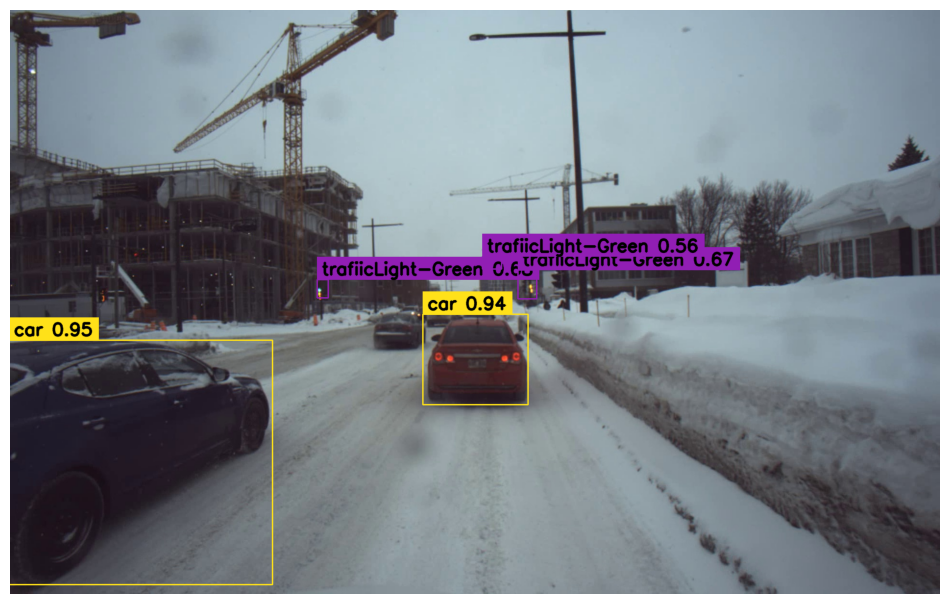

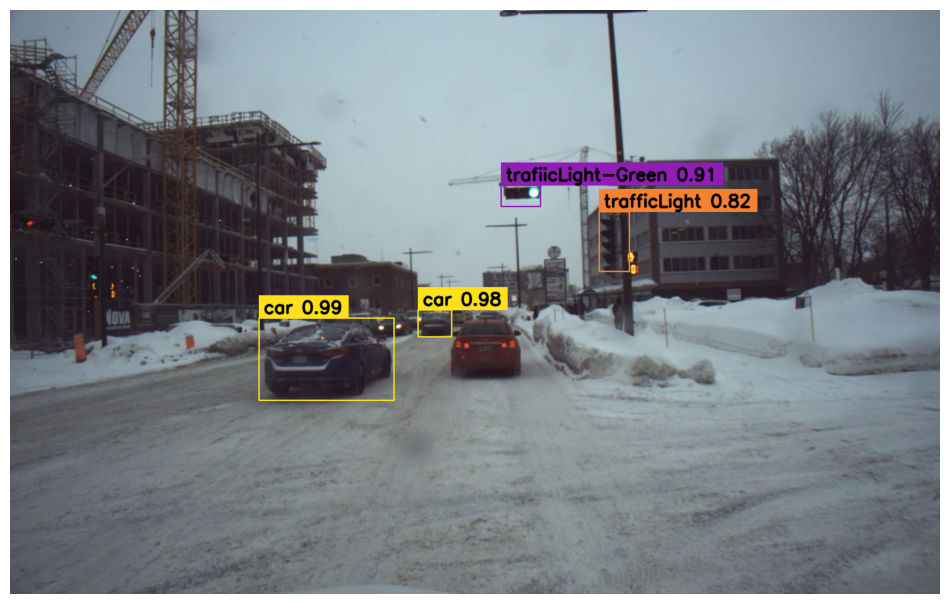

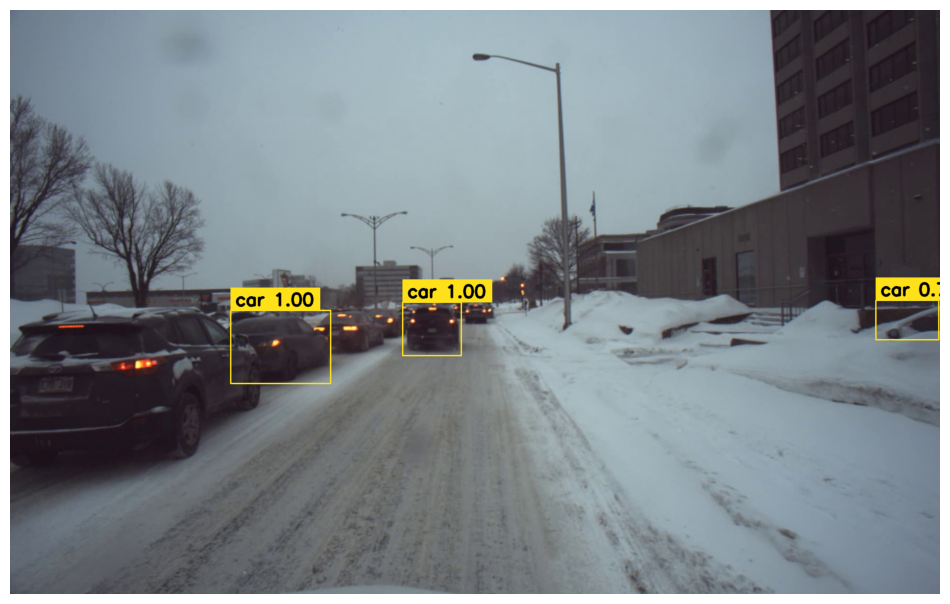

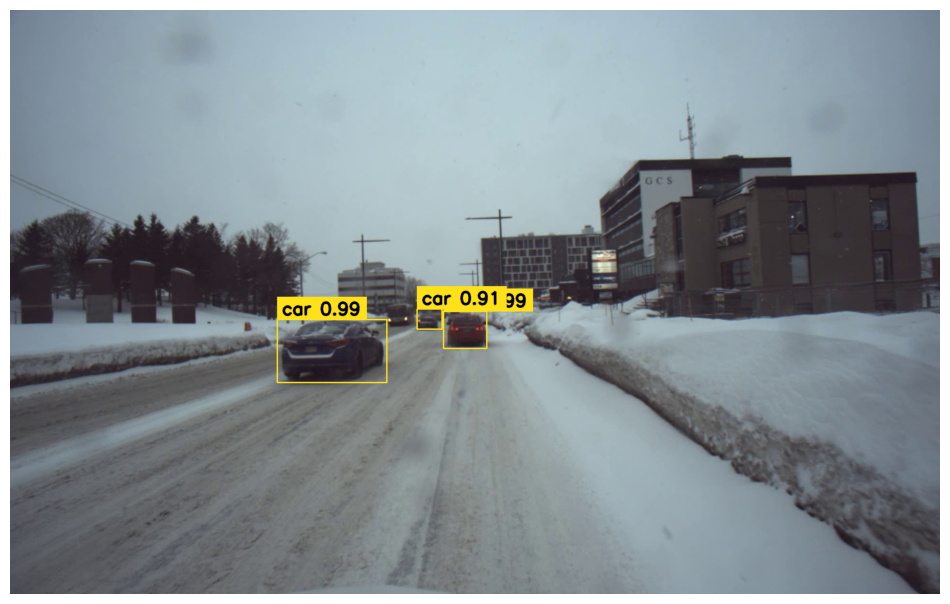

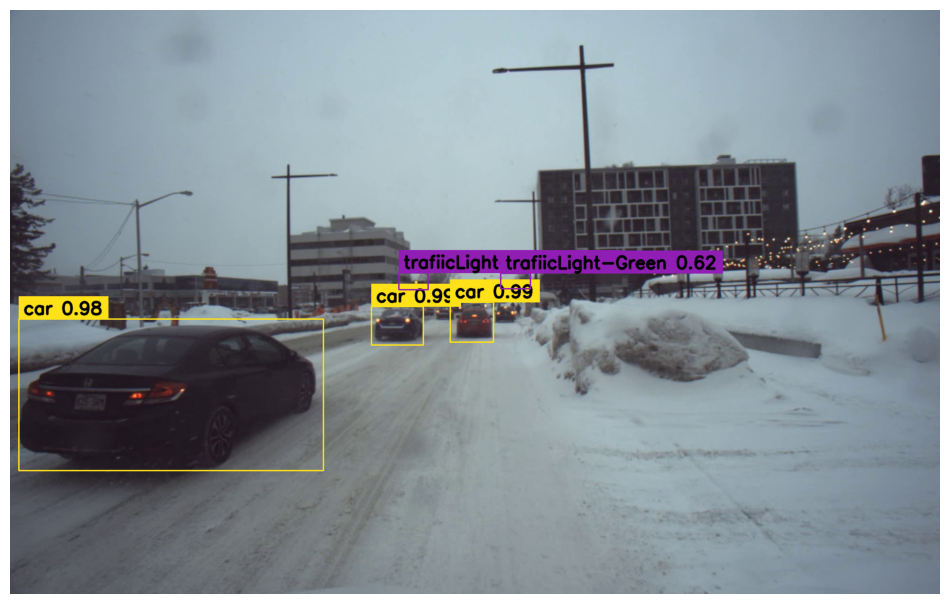

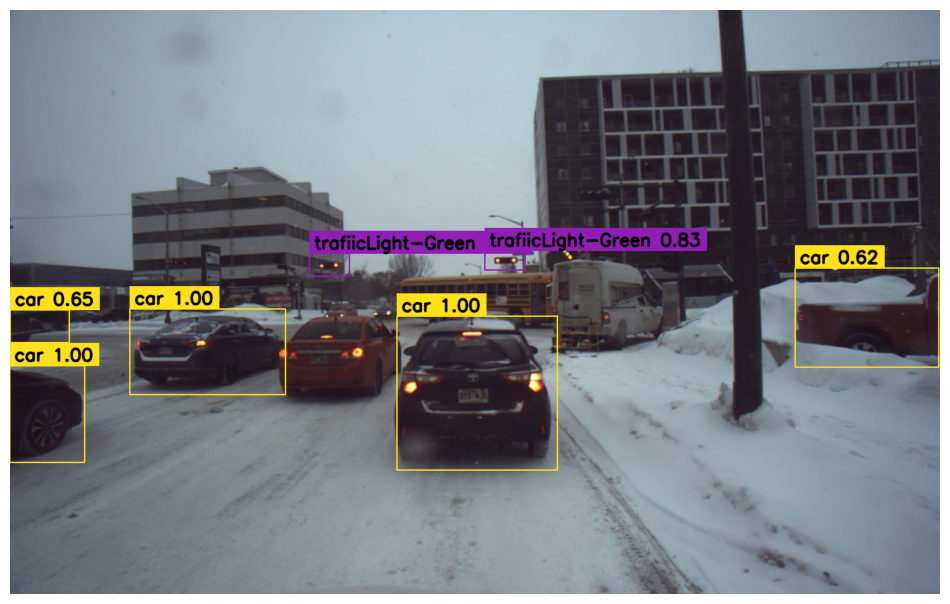

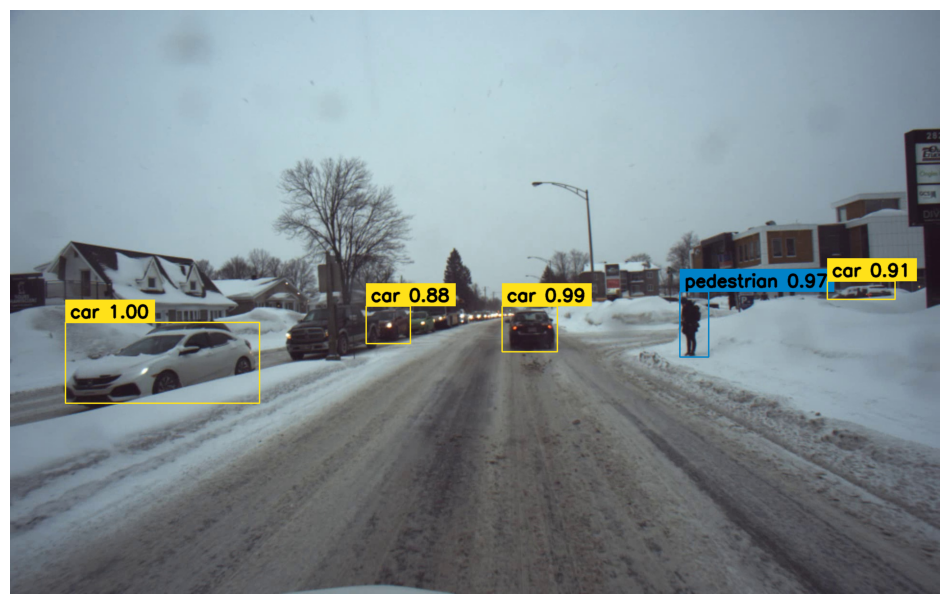

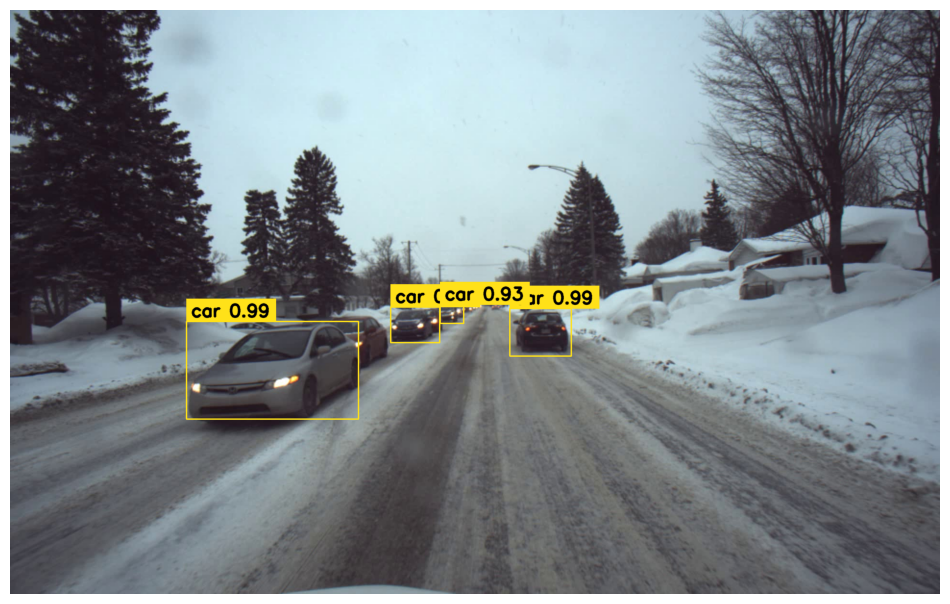

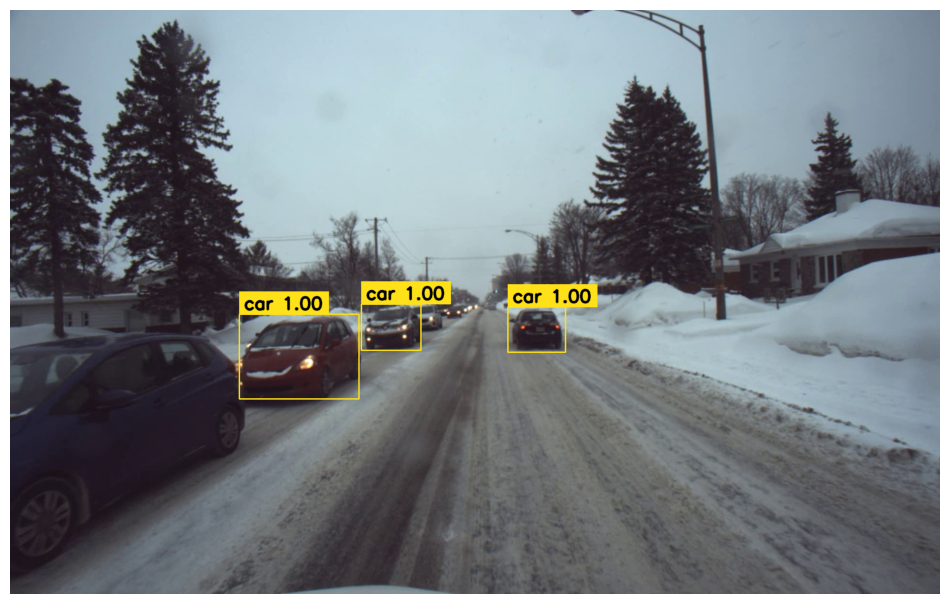

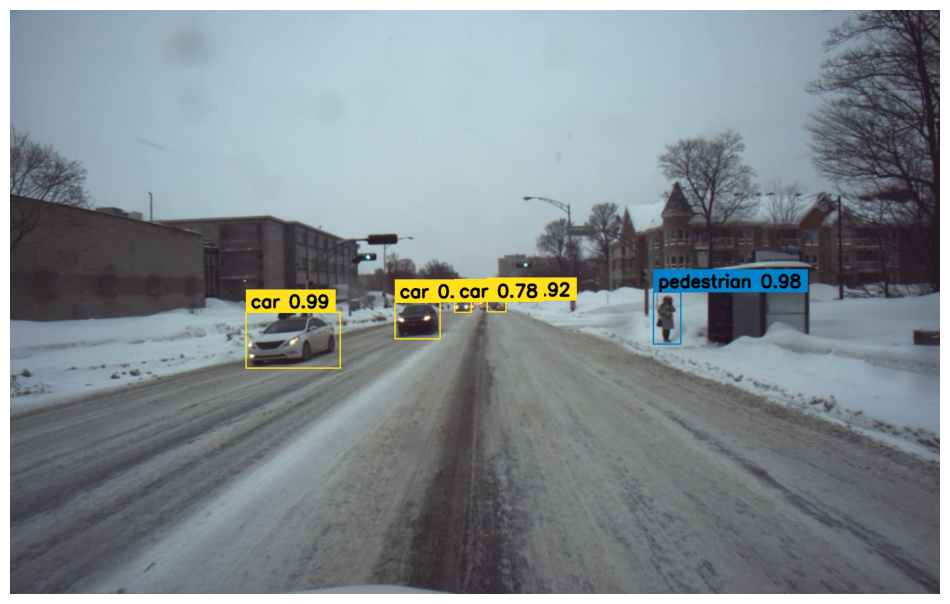

In [25]:
# Setup with updated annotator (bigger & bold text)
box_annotator = sv.BoxAnnotator(text_scale=1.2, text_thickness=3)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Parameters
GRID_COLS = 5
NUM_IMAGES = 1500
# Remove RESIZE_SHAPE since we won't resize now

# Collect frames
image_ids = TEST_DATASET.coco.getImgIds()
selected_ids = image_ids[1000:1020:2]  # <-- Only process images 200 to 399

# Metrics containers
true_positives = defaultdict(int)
false_positives = defaultdict(int)
false_negatives = defaultdict(int)
predictions_coco_format = []

iou_threshold = 0
image_id_counter = 0

# --- Main Loop ---
for image_id in selected_ids:
    try:
        image_info = TEST_DATASET.coco.loadImgs(image_id)[0]
        annotations = TEST_DATASET.coco.imgToAnns[image_id]
        image_path = os.path.join(TEST_DATASET.root, image_info['file_name'])
        image = cv2.imread(image_path)

        # Ground Truth
        gt_detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
        frame_gt = box_annotator.annotate(scene=image.copy(), detections=gt_detections, labels=[
            f"{id2label[class_id]}" for _, _, class_id, _ in gt_detections
        ])

        # Inference
        with torch.no_grad():
            inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
            outputs = model(**inputs)
            target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
            results = image_processor.post_process_object_detection(
                outputs=outputs, threshold=0.50, target_sizes=target_sizes
            )[0]

        dets = sv.Detections.from_transformers(transformers_results=results)

        # NMS
        if len(dets) > 0:
            boxes = torch.tensor(dets.xyxy, device=DEVICE)
            scores = torch.tensor(dets.confidence, device=DEVICE)
            keep_idxs = nms(boxes, scores, iou_threshold=iou_threshold).cpu().numpy()
            dets = sv.Detections(
                xyxy=np.array([dets.xyxy[i] for i in keep_idxs]),
                confidence=np.array([dets.confidence[i] for i in keep_idxs]),
                class_id=np.array([dets.class_id[i] for i in keep_idxs])
            )

        # Match predictions to ground truths
        match_predictions_to_gt(dets, gt_detections, iou_thresh=iou_threshold)

        # Save detections in COCO format
        for i in range(len(dets)):
            x1, y1, x2, y2 = dets.xyxy[i]
            width = x2 - x1
            height = y2 - y1
            predictions_coco_format.append({
                "image_id": image_id,
                "category_id": int(dets.class_id[i]),
                "bbox": [float(x1), float(y1), float(width), float(height)],
                "score": float(dets.confidence[i])
            })

        # Annotate frame with detections (no resize)
        labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in dets]
        frame = box_annotator.annotate(scene=image.copy(), detections=dets, labels=labels)

        # Convert BGR to RGB for matplotlib display
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display image in full scale, one per line
        plt.figure(figsize=(12, 18))  # Adjust this size if needed
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show()

    except Exception as e:
        pass
